In [1]:
import pandas as pd
import numpy as np
import datetime
import math
from datetime import datetime, timedelta
import scipy as sc
from statsmodels.tsa.statespace.sarimax import SARIMAX
import statsmodels.api as sm
from statsmodels.tsa import stattools
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from IPython.display import Image
import joblib
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
pd.options.plotting.backend = "plotly"
from pysolar.solar import get_altitude
from datetime import datetime, timedelta
import pytz
import joblib
import os
import time
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
#from plotly.subplots import make_subplots
pd.options.plotting.backend = "plotly"
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
import statsmodels.api as sm
from copy import deepcopy

import warnings
warnings.filterwarnings('ignore')

/opt/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
df_osnova = pd.read_csv('Custom_location.csv')
df_osnova.head(1)

,dt,dt_iso,timezone,city_name,lat,lon,temp,visibility,dew_point,feels_like,...,wind_gust,rain_1h,rain_3h,snow_1h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon
0,283996800,1979-01-01 00:00:00 +0000 UTC,10800,Custom location,55.773239,37.580463,-36.38,NaN,-39.09,-43.38,...,NaN,NaN,NaN,NaN,NaN,100,804,Clouds,overcast clouds,04n


In [7]:
def naive_forecast(x, h):
    return x.shift(h)

def draw_graph(df, quantity):
    df.tail(quantity).plot().update_layout(height=350, width=1300).show()

def prediction_score__(df):
    df=df.dropna()
    forecast = df['temp_forecast']
    fact = df['temp_fact']
    print(f"RMSE: {np.sqrt(mean_squared_error(fact, forecast)):.4f}")
    print(f"MAE: {mean_absolute_error(fact, forecast):.4f}")
    print(f"R2 Score: {r2_score(fact, forecast):.4f}")
    # print(f"SSE: {qualitySSE(fact,forecast):.4f}")
    # print(f"MAPE: {qualityMAPE(fact,forecast):.4f}")
    # print(f"MAPPE: {qualityMAPPE(fact,forecast):.4f}")
    # print(f"SMAPE: {qualitySMAPE(fact,forecast):.4f}")
    print(f"MASE: {qualityMASE(fact,forecast):.4f}")
    # print(f"MedianAE: {qualityMedianAE(fact,forecast):.4f}")
    # print(f"WAPPE: {qualityWAPPE(fact,forecast):.4f}")
    # print(f"WAMAXPE: {qualityWAMAXPE(fact,forecast):.4f}")
    # print(f"MedianAE: {qualityMedianAE(fact,forecast):.4f},\n")

# Quality functions
def qualitySSE(x,y):
    # Sum squared error
    # x,y - pandas structures
    # x - real values
    # y - forecasts
    return ((x-y)**2).sum() #, (x-y)**2

def qualityMSE(x,y):
    # Mean squared error
    # x,y - pandas structures
    # x - real values
    # y - forecasts
    return ((x-y)**2).mean() #, (x-y)**2

def qualityRMSE(x,y):
    # Root mean squared error
    # x,y - pandas structures
    # x - real values
    # y - forecasts
    return (((x-y)**2).mean())**(0.5) #, (x-y).abs()

def qualityMAE(x,y):
    # Mean absolute error
    # x,y - pandas structures
    # x - real values
    # y - forecasts
    return (x-y).abs().mean() #, (x-y).abs()

def qualityMAPE(x,y):
    # Mean absolute percentage error
    # x,y - pandas structures
    # x - real values
    # y - forecasts
    qlt = ((x-y).abs()/x.abs()).replace([np.inf, -np.inf], np.nan)
    return qlt.mean() #, qlt

def qualityMAPPE(x,y):
    # Mean absolute predicted percentage error
    # x,y - pandas structures
    # x - real values
    # y - forecasts
    qlt = ((x-y).abs()/y.abs()).replace([np.inf, -np.inf], np.nan)
    return qlt.mean() #, qlt

def qualitySMAPE(x,y):
    # Symmetric mean absolute percentage error
    # x,y - pandas structures
    # x - real values
    # y - forecasts
    qlt = (2*(x-y).abs()/(x+y)).replace([np.inf, -np.inf], np.nan)
    return qlt.mean() #, qlt

def qualityMAMAXPE(x,y):
    # Mean absolute maximum percentage error
    # x,y - pandas structures
    # x - real values
    # y - forecasts
    qlt = ((x-y).abs()/max(x.abs(), y.max())).replace([np.inf, -np.inf], np.nan)
    return qlt.mean() #, qlt

def qualityMASE(x,y, init_step=0):
    # Mean absolute scaled error
    # x,y - pandas structures
    # x - real values
    # y - forecasts
    qlt = ((x-y).abs()/(x-x.shift(1)).abs())[init_step:].replace([np.inf, -np.inf], np.nan)
    return qlt.mean() #, qlt

def qualityMedianAE(x,y):
    # Median absolute error
    # x,y - pandas structures
    # x - real values
    # y - forecasts
    return ((x-y).abs()).median() #, (x-y).abs()

def qualityWAPE(x,y):
    # Weighted absolute percentage error
    # x,y - pandas structures
    # x - real values
    # y - forecasts
    denom = x.abs().sum()
    qlt = ((x-y).abs()/denom).replace([np.inf, -np.inf], np.nan)
    return qlt.sum() #, qlt

def qualityWAPPE(x,y):
    # Weighted absolute percentage error
    # x,y - pandas structures
    # x - real values
    # y - forecasts
    denom = y.abs().sum()
    qlt = ((x-y).abs()/denom).replace([np.inf, -np.inf], np.nan)
    return qlt.sum() #, qlt

def qualityWAMAXPE(x,y):
    # Weighted absolute maximum percentage error
    # x,y - pandas structures
    # x - real values
    # y - forecasts
    denom = pd.merge(x, y, right_index = True, left_index = True).max(axis = 1).sum()
    qlt = ((x-y).abs()/denom).replace([np.inf, -np.inf], np.nan)
    return qlt.sum() #, qlt

def qualityMedianAE(x,y):
    # Median absolute error
    # x,y - pandas structures
    # x - real values
    # y - forecasts
    return ((x-y).abs()).median() #, (x-y).abs()
	
def get_autoregrmatrix(x,h,K):
    T = len(x)
    X = sc.linalg.hankel(x[:T-h-K+1], np.hstack((x[T-h-K:T-h]))) # is needed to repeat x[-K] in second part
    y = x[K+h-1:]
    return X,y

def build_forecast(h, ts, alg_name, alg_title, params, step='D'):
  'grid'
  FRC_TS = dict()
  for p in params:
      frc_ts = pd.DataFrame(columns = ts.columns)
      for cntr in ts.columns:
          frc_ts[cntr] = eval(alg_name)(ts[cntr], h, p)
      FRC_TS['%s %s' % (alg_title, p)] = frc_ts
  return FRC_TS

def AdditiveWintersExponentialSmoothing(x, h, params, freq = None):
    T = len(x)
    alpha = params['alpha']
    gamma = params['gamma']
    p = params['seasonality_period']
    if freq is None:
      freq = pd.infer_freq(x.index)
    forecast = pd.Series(index = x.index.append(pd.date_range(x.index[-1], periods=h+1, freq=freq)[1:]), name = 'fcst '+x.name)
    l= np.NaN
    s= []
    for cntr in range(T):
        if not math.isnan(x.iloc[cntr]):
            if math.isnan(l):
                l= x.iloc[cntr]
            if len(s)==0:
                for i in range(p):
                    s.append(x.iloc[i])
            if cntr<p:
                l = alpha*(x.iloc[cntr]-s[cntr])+(1-alpha)*l
            else:
                l = alpha*(x.iloc[cntr]-s[cntr-p])+(1-alpha)*l
                s.append(gamma*(x.iloc[cntr]-l)+(1-gamma)*s[cntr-p])
        forecast.iloc[cntr+h] = l + s[cntr+h-(1+h//p)*p]
    return forecast

def plot_ts_forecast(ts, frc_ts, ts_num=0, alg_title='', title_text = ''):
    frc_ts.columns = ts.columns+'; '+alg_title
    ts[[ts.columns[ts_num]]].merge(frc_ts[[frc_ts.columns[ts_num]]], how = 'outer', left_index = True, right_index = True)\
      .plot().update_layout(height=350, width=1300,
                  xaxis_title="time ticks",
                  yaxis_title="ts and forecast values", title_text=title_text, ).show()

def TheilWageExponentialSmoothing(x, h, params, freq = None): 
    T = len(x)
    alpha = params['alpha']
    beta = params['beta']
    gamma = params['gamma']
    p = params['seasonality_period']
    if freq is None:
      freq = pd.infer_freq(x.index)
    # forecast = [np.NaN]*(T+h)
    forecast = pd.Series(index = x.index.append(pd.date_range(x.index[-1], periods=h+1, freq=freq)[1:]), name = 'fcst '+x.name)
    l= np.NaN
    b=np.NaN
    s= []
    for cntr in range(T):
        if not math.isnan(x.iloc[cntr]):
            if math.isnan(l):
                l= x.iloc[cntr]
            if math.isnan(b):
                b= 0
            if len(s)==0:
                for i in range(p):
                    s.append(x.iloc[i])
            if cntr<p:
                l_old=l
                l = alpha*(x.iloc[cntr]-s[cntr])+(1-alpha)*(l+b)
                b=beta*(l-l_old)+(1-beta)*b
            else:
                l_old=l
                l = alpha*(x.iloc[cntr]-s[cntr-p])+(1-alpha)*(l+b) # recurrent smoothing of level
                b=beta*(l-l_old)+(1-beta)*b
                s.append(gamma*(x.iloc[cntr]-l)+(1-gamma)*s[cntr-p])
        forecast.iloc[cntr+h] = l+b*h + s[cntr+h - (1+h//p)*p]
    return forecast

====================  START  =====================
================= PREPROVESSING  =================
Ниже представленные графики отображают влияние новых признаков (расвета, заката и разницу между ними) на температуру.


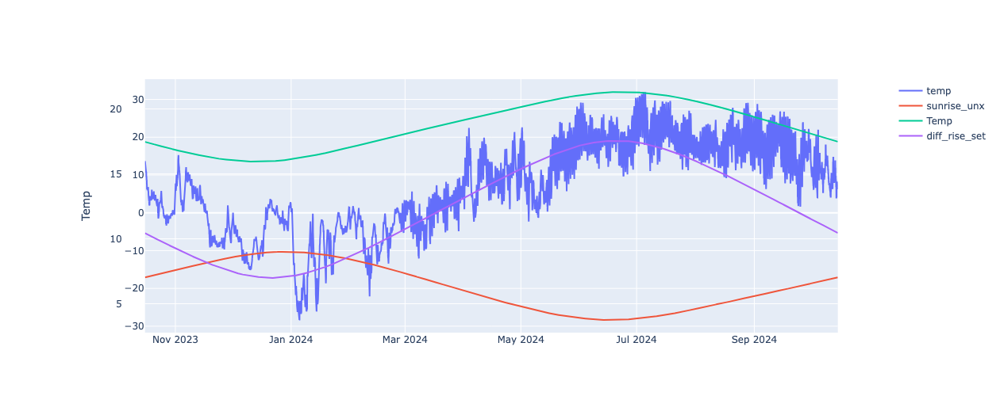

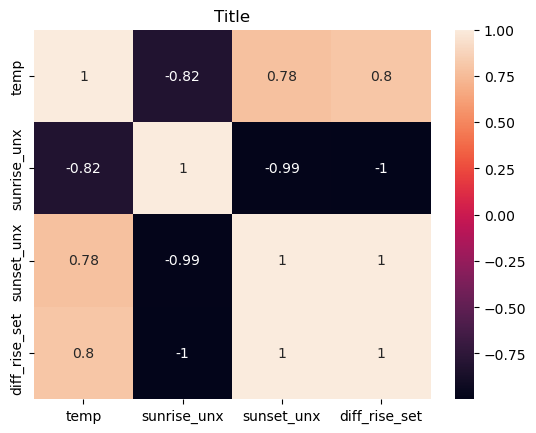

Главное преимущество новых признаков заключается в том, что мы всегда можешь заранее знать точное значение светового дня в любом году.
================= NAIVE FORECAST  =================
Наивный прогноз. Что будет если мы просто повторим вчерашний день:
RMSE: 3.5443
MAE: 2.5827
R2 Score: 0.8985
MASE: 26.2248


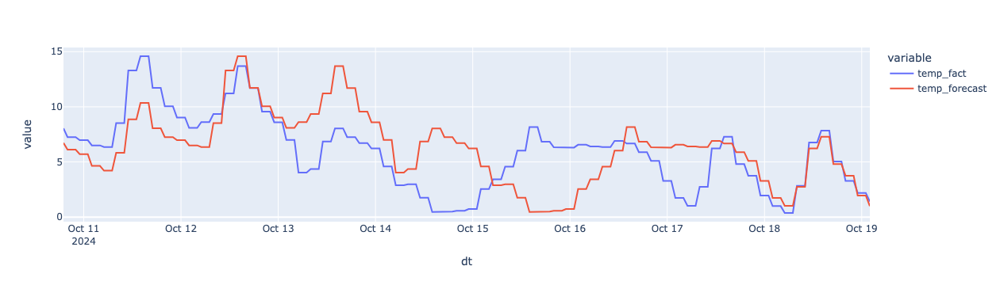

Наивный прогноз. А если только сдвинем значения температуры на 1 часа вперед:
RMSE: 1.1524
MAE: 0.6160
R2 Score: 0.9893
MASE: 1.0009


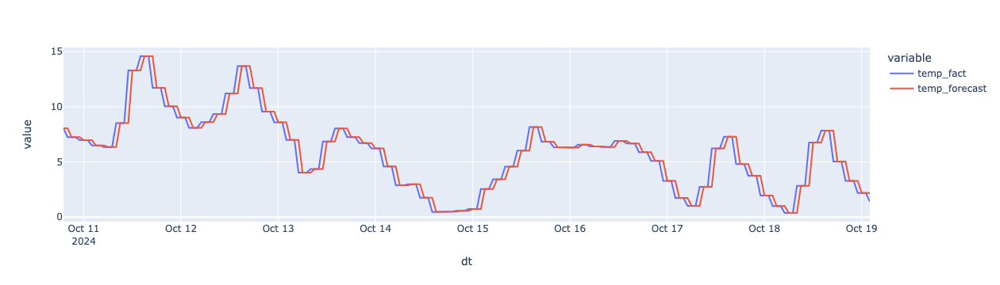

Не смотря на быстрое решение, однако допустимо сдвигать не более чем 1 час вперед.
Со сдвигом на большее количество часов погрешность стремительно увеличивается.
====== AdditiveWintersExponentialSmoothing  ======


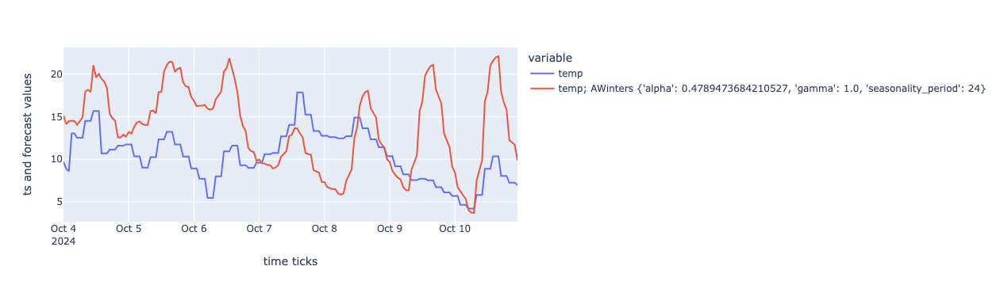

RMSE = 6.0227
MAE = 4.9732
R2 Score = -3.2319
MAPE = 0.5336


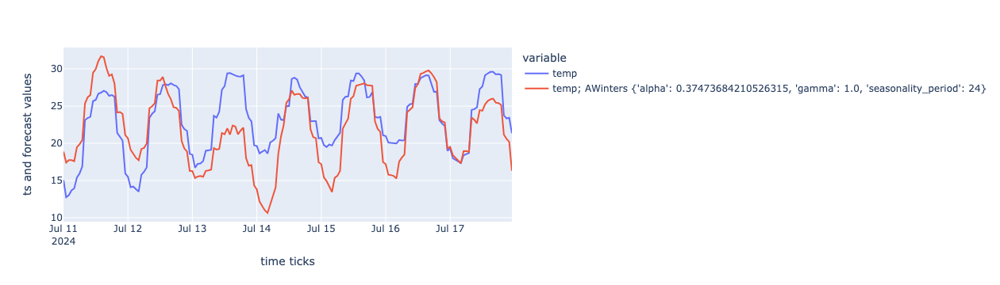

RMSE = 3.7234
MAE = 3.0809
R2 Score = 0.3311
MAPE = 0.1426


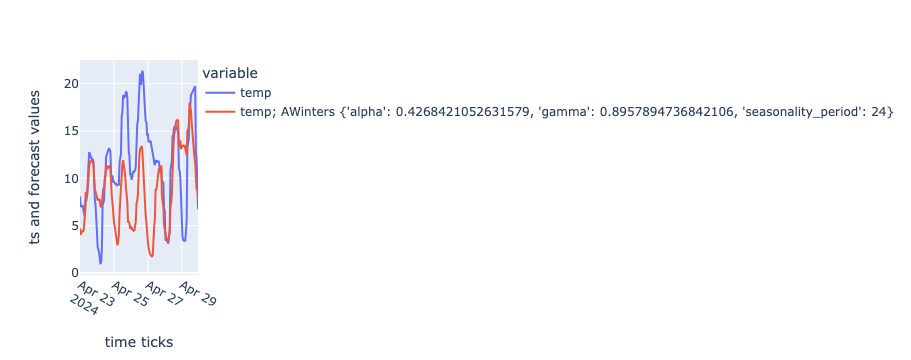

RMSE = 5.5599
MAE = 4.3718
R2 Score = -0.3049
MAPE = 0.5412


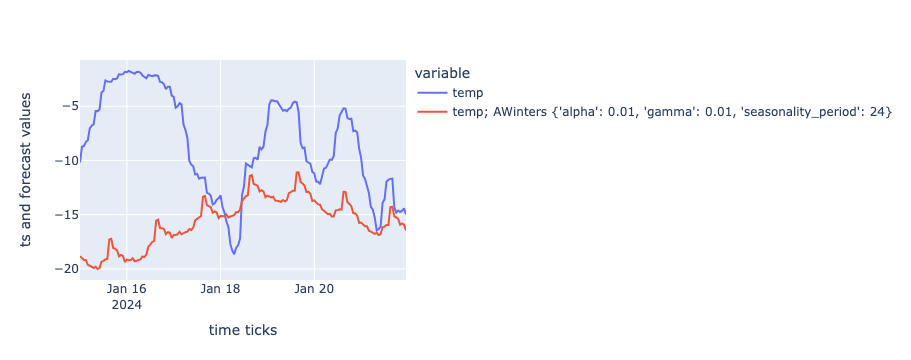

RMSE = 9.2887
MAE = 7.489
R2 Score = -3.0278
MAPE = 2.0873

Подведем итоги кросс-валидации на 4 сезонах:
RMSE = 9.2887
MAE = 7.489
R2 Score = -3.0278
MAPE = 2.0873
Исходя из высокой ошибки показателей и не способностью быстро адаптироваться под быстро меняющийся тренд данная модель не подходит для прогнозирования температуры.
========== TheilWageExponentialSmoothing =========


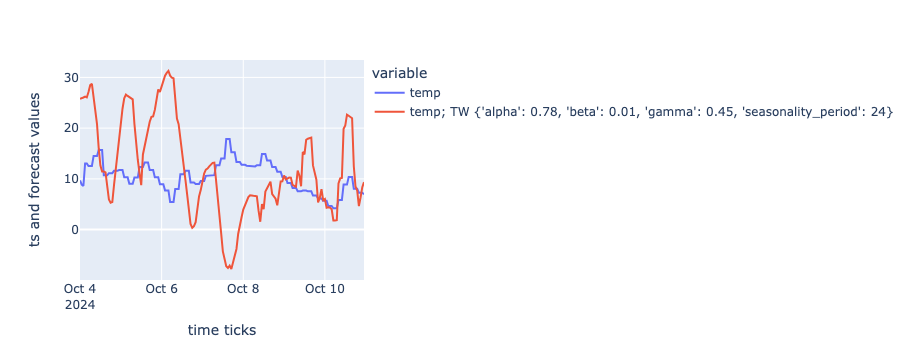

RMSE = 10.6666
MAE = 8.1526
R2 Score = -12.2739
MAPE = 0.8147


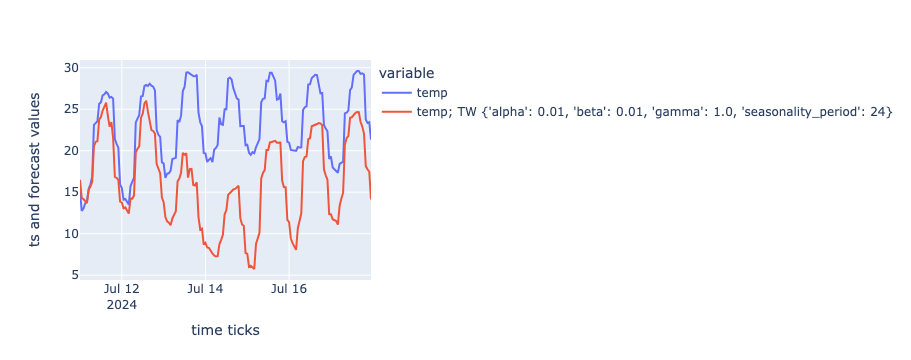

RMSE = 7.9529
MAE = 6.8909
R2 Score = -2.0515
MAPE = 0.2999


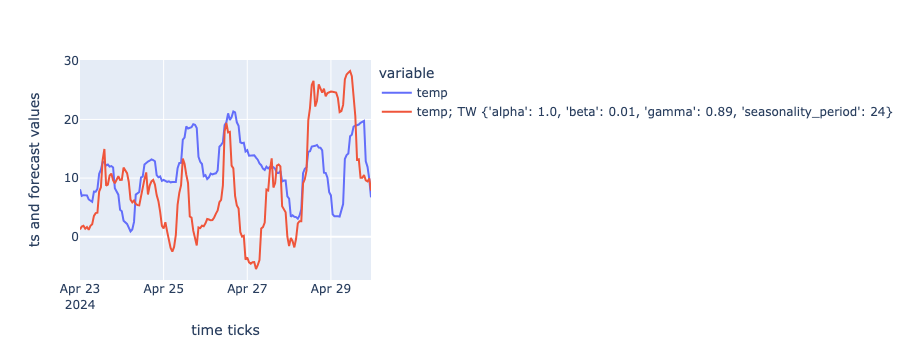

RMSE = 9.6159
MAE = 7.828
R2 Score = -2.903
MAPE = 0.9513


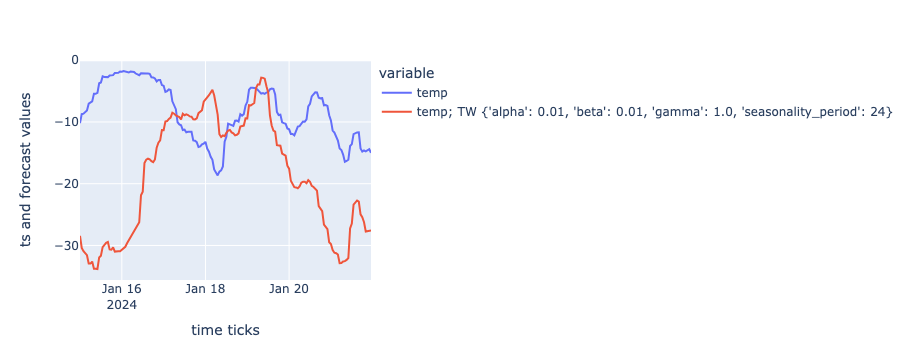

RMSE = 15.2706
MAE = 12.2407
R2 Score = -9.886
MAPE = 3.019

Подведем итоги кросс-валидации на 4 сезонах:
RMSE = 15.2706
MAE = 12.2407
R2 Score = -9.886
MAPE = 3.019
Данная модель перебираает значени дольше предыдущей, однако также не подходит для пронозирования температуры.
==================== SARIMAX =====================
Hours in day differencing (24)


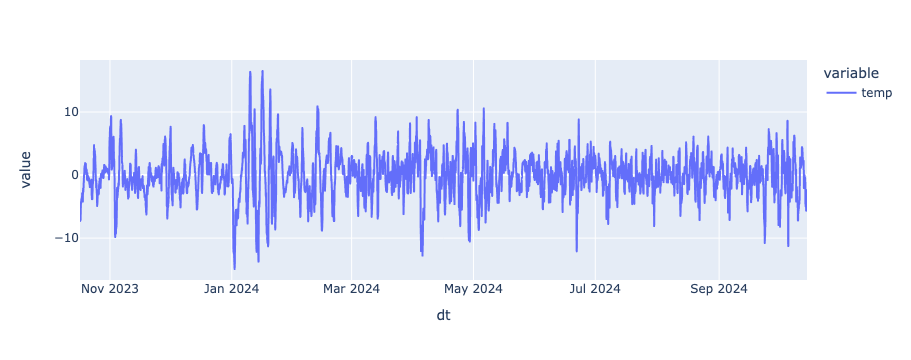

Days in year differencing (365)


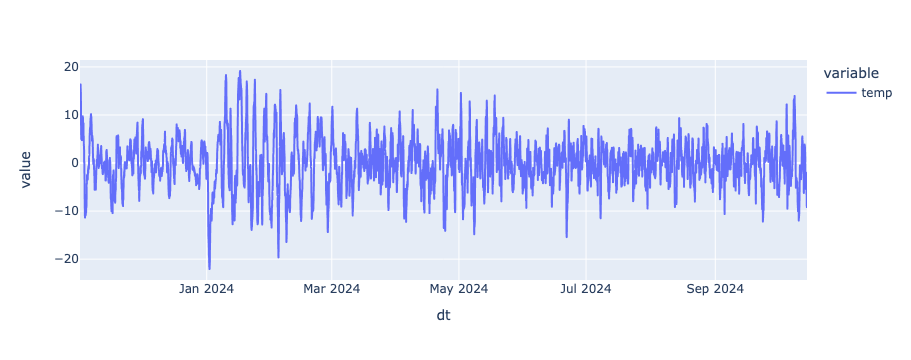

Season differencing (4)


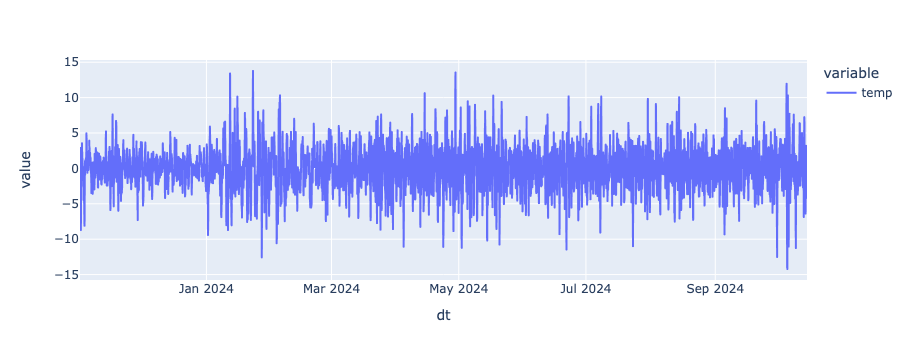

Trend differencing


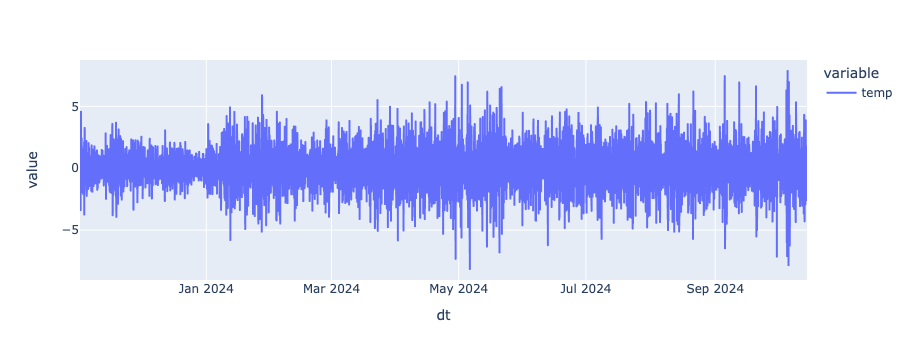

The Augmented Dickey-Fuller test statistic -29.091153, 
pvalue: 0.00 
maximal Lag: 35 
critical values: {'1%': -3.4311351777732133, '5%': -2.8618869942142844, '10%': -2.5669547001769786}
The KPSS test statistic 0.021020, 
pvalue: 0.10 
maximal Lag: 253 
table distribution: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
                                             SARIMAX Results                                              
Dep. Variable:                                               temp   No. Observations:                 6614
Model:             SARIMAX(3, 0, 0)x(2, 0, [1, 2, 3, 4, 5, 6], 4)   Log Likelihood               -8810.142
Date:                                            Wed, 11 Dec 2024   AIC                          17650.284
Time:                                                    22:22:13   BIC                          17752.239
Sample:                                                11-01-2023   HQIC                         17685.517
                            

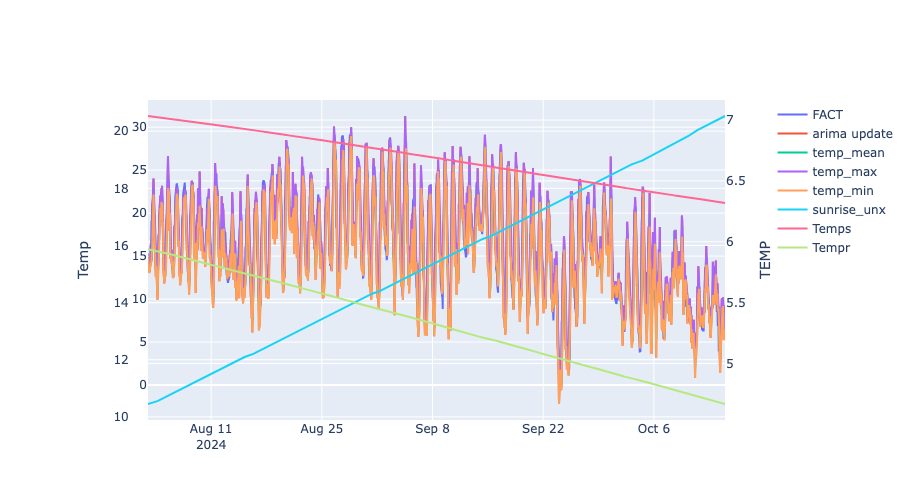

RMSE: 1.7496
MAE: 1.3396
R2 Score: 0.9064
MAPE: 0.0993

        Модель SARIMAX показала нилучшие результаты по сравнению с предыдущими моделями.
        Однако имеет ряд серьезных особенностей:
          - Модель необходимо периодически обучать. Автоматические варианты перебора параметров могут занимать очень много времени, 
        а неудачный перебор приводит к сложности модели (также и в плане веса файла, если записывать в отдельный файл).
          - Для предсказания температуры важно также учитывать и другие атрибуты. Значения погоды могут быстро меняться из-за грозы, ветра и тп. 
        В отрыве от других признаков качество будет храмать на любых моделях. 
        Однако данная модель показала хорошие результаты если мы будем знать сезонность и тренд предсказываемого периода.
          - Определенный плюс данной модели - скорость работы предобученной модели.
        
==================== FINISH  =====================
Successful


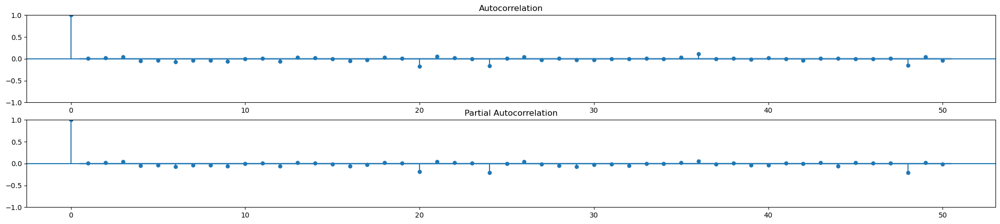

In [11]:
class Sun:
    def find_event_time(self, latitude, longitude, day, event_type, timezone_offset):
        """Поиск времени восхода или заката с использованием бинарного поиска."""
        
        tz = pytz.FixedOffset(timezone_offset * 60)
        day = day.replace(tzinfo=tz)
        low = 0
        high = 1440
        event_time = None
    
        while low <= high:
            mid = (low + high) // 2
            current_time = day + timedelta(minutes=mid)
            altitude = get_altitude(latitude, longitude, current_time)
    
            if event_type == "sunrise":
                if altitude > -0.833:
                    event_time = current_time
                    high = mid - 1
                else:
                    low = mid + 1
            elif event_type == "sunset":
                if altitude <= -0.833:
                    event_time = current_time
                    high = mid - 1
                else:
                    low = mid + 1
        return event_time
    
    def get_sun_rise_set(self, latitude, longitude, timezone_offset, day):
        """Расчет времени рассвета и заката для указанной даты."""
        
        sunrise = self.find_event_time(latitude, longitude, day, "sunrise", timezone_offset)
        sunset = self.find_event_time(latitude, longitude, day, "sunset", timezone_offset)
        return sunrise, sunset
    
    
    def find_midpoints(self, sunrise, sunset, next_day_sunrise):
        """Вычисление середины дня и середины ночи."""
        
        if sunrise and sunset:
            midpoint_day = sunrise + (sunset - sunrise) / 2
        else:
            midpoint_day = None
        if sunset and next_day_sunrise:
            midpoint_night = sunset + (next_day_sunrise - sunset) / 2
        else:
            midpoint_night = None
    
        return midpoint_day, midpoint_night
    
    def generate_year_calendar_with_midpoints(self, year, latitude, longitude, timezone_offset):
        """ Генерация календаря с временем рассвета, заката, середины дня и середины ночи. """
        
        tz = pytz.FixedOffset(timezone_offset * 60)
        start_date = datetime(year, 1, 1, tzinfo=tz)
        end_date = datetime(year + 1, 1, 1, tzinfo=tz)
        current_date = start_date
        calendar = []
    
        while current_date < end_date:
            sunrise, sunset = self.get_sun_rise_set(latitude, longitude, timezone_offset, current_date)
            next_day_sunrise, _ = self.get_sun_rise_set(latitude, longitude, timezone_offset, current_date + timedelta(days=1))
            midpoint_day, midpoint_night = self.find_midpoints(sunrise, sunset, next_day_sunrise)
            sunrise_str = sunrise.astimezone().strftime('%H:%M:%S') if sunrise else None
            sunset_str = sunset.astimezone().strftime('%H:%M:%S') if sunset else None
            midpoint_day_str = midpoint_day.astimezone().strftime('%H:%M:%S') if midpoint_day else None
            midpoint_night_str = midpoint_night.astimezone().strftime('%H:%M:%S') if midpoint_night else None
            calendar.append({"date": current_date.strftime('%Y-%m-%d'),"sunrise": sunrise_str,
                             "sunset": sunset_str,"midpoint_day": midpoint_day_str,"midpoint_night": midpoint_night_str,})
            current_date = current_date+timedelta(days=1)
        return calendar
    
    def get_unix_time(self, time_str):
        time_obj = datetime.strptime(time_str, "%H:%M:%S").replace(year=1970, month=1, day=1) 
        delta = datetime(1970, 1, 1,0,0,0,0).replace(hour=0, minute=0, second=0, microsecond=0) 
        return round(((time_obj-delta).total_seconds() / 3600),3) # hours
        # return round(((time_obj-delta).total_seconds() / 60),3)   # minutes
        # return (time_obj-delta).total_seconds()                   # sec
    
    def main(self, years, latitude, longitude, timezone_offset, save_table, calendar_years):
        """ Год, широта, долгота, часовой пояс,  флаг на запись таблицы в csv файл."""
        
        try:
            result_calendar = pd.read_csv(f'sunrise_sunset_{years}.csv').iloc[:,1:]
        except:
            result_calendar=pd.DataFrame()
            for year in [years - i for i in range(calendar_years)]: # если надо больше лет, доставьте тут больше значение
                calendar = pd.DataFrame(self.generate_year_calendar_with_midpoints(year, latitude, longitude, timezone_offset))
                calendar['sunrise_unx']=calendar['sunrise'].apply(self.get_unix_time)
                calendar['sunset_unx']=calendar['sunset'].apply(self.get_unix_time)
                # calendar['midpoint_day_unx']=calendar['midpoint_day'].apply(self.get_unix_time) # полдень
                # calendar['midpoint_night_unx']=calendar['midpoint_night'].apply(self.get_unix_time) # полночь
                result_calendar=pd.concat([result_calendar, calendar])
            result_calendar=result_calendar[['date','sunrise_unx','sunset_unx']]
            if save_table:
                result_calendar.to_csv(f'sunrise_sunset_{years}.csv')
        return result_calendar

class Models():
    def __init__(self,date_start,date_end, step, predict_columns, fact=df_osnova, freq='h', test_weeks=datetime.now()):
        self.date_start = date_start
        self.date_end = date_end
        self.step = step
        self.predict_columns = predict_columns
        self.freq = freq
        self.test_weeks = test_weeks

    def naive_forecast(self, x, h):
        return x.shift(h)
    
    def draw_graph(self, df, quantity):
        df.tail(quantity).plot().update_layout(height=350, width=1300).show()
        
    def model_naive_eda(self, df):
        '''
        EDA. Наивный прогноз. + оценка.
        '''
        print('================= NAIVE FORECAST  =================')
        df=self.test_df.set_index('dt')[['temp']].merge(naive_forecast(x=self.test_df.set_index('dt')[['temp']], h = 24), how='left', left_index = True, right_index = True, suffixes=('_fact', '_forecast'))
        print('Наивный прогноз. Что будет если мы просто повторим вчерашний день:')
        prediction_score__(df)
        self.draw_graph(df, 200)
        df=self.test_df.set_index('dt')[['temp']].merge(naive_forecast(x=self.test_df.set_index('dt')[['temp']], h = 1), how='left', left_index = True, right_index = True, suffixes=('_fact', '_forecast'))
        print('Наивный прогноз. А если только сдвинем значения температуры на 1 часа вперед:')
        prediction_score__(df)
        self.draw_graph(df, 200)
        print('Не смотря на быстрое решение, однако допустимо сдвигать не более чем 1 час вперед.\nСо сдвигом на большее количество часов погрешность стремительно увеличивается.')
        
    def preprocessing(self, df, df_ss):
        print('================= PREPROVESSING  =================')
        df['dt'] = df['dt'].apply(lambda row: datetime.fromtimestamp(row))
        self.test_df=df.copy()
        df = df[(df['dt']>=self.date_start)&(df['dt']<=self.date_end)].dropna(axis=1).drop_duplicates()
        calendar = pd.DataFrame({'dt':pd.date_range(start=self.date_start,end=self.date_end, freq=self.freq)})
        df = calendar.merge(df, on='dt', how='left')        
        df.set_index('dt',inplace=True)
        df = df.interpolate()
        
        all_result = df.copy().reset_index()
        all_result['dt']=all_result['dt'] + timedelta(hours=self.step)
        ts = all_result[(all_result['dt']>=self.date_start)&(all_result['dt']<=self.date_end)][['dt','temp']].reset_index(drop=True).copy()
        all_result=all_result[all_result['dt']>=self.date_end].reset_index(drop=True).set_index('dt')
        
        # ++++++++++++++++++++++++   Future Engineering  ++++++++++++++++++++++++++++++
        ''' В данном фрагменте кода добавляю новый таргет - световая часть дня преобразованная в юникс число и распределенное на весь год.'''
        
        df_ss.rename(columns={'date':'dt'},  inplace=True)
        df_ss['dt'] = pd.to_datetime(df_ss['dt'] + ' 00:00:00')
        df_ss=df_ss.set_index('dt')
        ts=ts.set_index('dt')
        ts=ts.join(df_ss)
        all_result = df_ss.copy()
        ts=ts.interpolate()
        ts = ts[['temp', 'sunrise_unx', 'sunset_unx']]
        ts['diff_rise_set'] = -(ts['sunrise_unx'] - ts['sunset_unx'])
        print('Ниже представленные графики отображают влияние новых признаков (расвета, заката и разницу между ними) на температуру.')
        fig = go.Figure()
        fig.add_trace(go.Scatter(x=ts['temp'].index, y=ts['temp'], name="temp"))
        fig.add_trace(go.Scatter(x=ts['temp'].index, y=ts['sunrise_unx'], name="sunrise_unx", yaxis="y3"))
        fig.add_trace(go.Scatter(x=ts['temp'].index, y=ts['sunset_unx'], name="Temp", yaxis="y3"))
        fig.add_trace(go.Scatter(x=ts['sunset_unx'].index, y=ts['diff_rise_set'], name="diff_rise_set", yaxis="y3"))
        fig.update_layout(
            xaxis=dict(domain=[0.1, 0.95]),yaxis=dict(),
            yaxis2=dict(title="diff_rise_set",overlaying="y",side="right"),
            yaxis3=dict(title="Temp", anchor="free", overlaying="y", autoshift=True),
        )
        fig.update_layout(height=500, width=1300).show()
        sns.heatmap(ts.corr(), annot=True)
        plt.title('Title')
        plt.show()
        print('''Главное преимущество новых признаков заключается в том, что мы всегда можешь заранее знать точное значение светового дня в любом году.''')
        return df, all_result, ts

    def plot_acf_pacf(self, model, lags=365):        
        fig = plt.figure(figsize=[25,5])
        ax1 = fig.add_subplot(211)
        fig = sm.graphics.tsa.plot_acf(model.resid.values.squeeze(), lags=lags, ax=ax1)
        ax2 = fig.add_subplot(212)
        fig = sm.graphics.tsa.plot_pacf(model.resid.values.squeeze(), lags=lags, ax=ax2)

    def mybuild_forecast(self, h, ts, alg_name, alg_title, params, step=None):
      FRC_TS = dict()
      for p in params:
          frc_ts = pd.DataFrame(columns = ts.columns)
          for cntr in ts.columns:
              frc_ts[cntr] = eval(alg_name)(ts[cntr], h, p, step)
          FRC_TS['%s %s' % (alg_title, p)] = frc_ts
      return FRC_TS
    
    def model_awinters(self, ts_):
        print('====== AdditiveWintersExponentialSmoothing  ======')
        ALPHA = np.linspace(0.01,1,20)
        GAMMA = np.linspace(0.01,1,20)
        df_scores = pd.DataFrame()
        for dt in self.test_weeks:
            ts=ts_[:dt][['temp']].copy()[-777:]
            wint_params = [{'alpha':alpha, 'gamma':gamma, 'seasonality_period':24} for alpha in ALPHA for gamma in GAMMA]
            FRC_SEAS_TS = self.mybuild_forecast(h=168, ts=ts[:-168], alg_name =  'AdditiveWintersExponentialSmoothing', alg_title='AWinters',params = wint_params, step='h')
            qlt_winters = pd.DataFrame(index = ts.columns, columns = FRC_SEAS_TS.keys())
            start_ix = ts[:-168].index.min()
            end_ix = ts[:-168].index.max()
            ix = ts.loc[start_ix:end_ix].index
            for param_cntr in sorted(qlt_winters.columns):
                frc_wage = FRC_SEAS_TS[param_cntr]
                qlt_winters[param_cntr] = qualityMAPE(ts.loc[ix], frc_wage.loc[ix])
            alg_name = qlt_winters[qlt_winters.columns].mean().sort_values().index[0]      
            test_period_start=str(ts.iloc[-168:-167].index[0])
            plot_ts_forecast(ts[-168:], FRC_SEAS_TS[alg_name][-168:], ts_num=0, alg_title=alg_name)
            mape = qualityMAPE(ts[-168:], FRC_SEAS_TS[alg_name][-168:])
            score = pd.DataFrame({  'RMSE':[np.round(np.sqrt(mean_squared_error(ts[-168:], FRC_SEAS_TS[alg_name][-168:])),4)],
                                    'MAE':[np.round(mean_absolute_error(ts[-168:], FRC_SEAS_TS[alg_name][-168:]),4)],
                                    'R2 Score':[np.round(r2_score(ts[-168:], FRC_SEAS_TS[alg_name][-168:]),4)],
                                    'MAPE':[np.round(mape,4)],
                                    # 'MAPPE':[np.round(qualityMAPPE(ts[-168:],FRC_SEAS_TS[alg_name][-168:]),4)],
                                    # 'SMAPE':[np.round(qualitySMAPE(ts[-168:],FRC_SEAS_TS[alg_name][-168:]),4)],
                                    # 'MASE':[np.round(qualityMASE(ts[-168:],FRC_SEAS_TS[alg_name][-168:]),4)]
                                 })
            df_scores = pd.concat([df_scores, score])
            for ind in list(score.columns):
                print(f'{score[ind].name} =', score[ind].mean())
        print('\n====================')
        print('Подведем итоги кросс-валидации на 4 сезонах:')
        for ind in list(df_scores.columns):
            print(f'{df_scores[ind].name} =', score[ind].mean())
        print('Исходя из высокой ошибки показателей и не способностью быстро адаптироваться под быстро меняющийся тренд данная модель не подходит для прогнозирования температуры.')
        return FRC_SEAS_TS[alg_name]

    def model_twagees(self, ts_):
        print('========== TheilWageExponentialSmoothing =========')
        df_scores = pd.DataFrame()
        ALPHA = np.linspace(0.01,1,10)
        BETA  = np.linspace(0.01,1,10)
        GAMMA = np.linspace(0.01,1,10)
        for dt in self.test_weeks:
            wage_year = ts_[:dt][['temp']].copy()[-777:]
            tw_params = [{'alpha':alpha, 'beta':beta, 'gamma':gamma, 'seasonality_period':24} for alpha in ALPHA for gamma in GAMMA for beta in BETA]
            FRC_TREND_SEAS_TS = self.mybuild_forecast(h=168, ts=wage_year[:-168], alg_name = 'TheilWageExponentialSmoothing', alg_title='TW',params = tw_params, step='h')
            qlt_tw = pd.DataFrame(index = wage_year.columns, columns = FRC_TREND_SEAS_TS.keys())
            start_ix = wage_year[:-168].index.min()
            end_ix = wage_year[:-168].index.max()
            ix = wage_year.loc[start_ix:end_ix].index
            for param_cntr in sorted(qlt_tw.columns):
                frc = FRC_TREND_SEAS_TS[param_cntr]
                qlt_tw[param_cntr] = qualityMAPE(wage_year.loc[ix], frc.loc[ix])
            alg_name = qlt_tw[qlt_tw.columns].mean().sort_values().index[0]
            test_period_start=str(wage_year.iloc[-168:-167].index[0])
            plot_ts_forecast(wage_year[-168:], FRC_TREND_SEAS_TS[alg_name][-168:], ts_num=0, alg_title=alg_name)
            mape = qualityMAPE(wage_year[-168:], FRC_TREND_SEAS_TS[alg_name][-168:])
            score = pd.DataFrame({  'RMSE':[np.round(np.sqrt(mean_squared_error(wage_year[-168:], FRC_TREND_SEAS_TS[alg_name][-168:])),4)],
                                    'MAE':[np.round(mean_absolute_error(wage_year[-168:], FRC_TREND_SEAS_TS[alg_name][-168:]),4)],
                                    'R2 Score':[np.round(r2_score(wage_year[-168:], FRC_TREND_SEAS_TS[alg_name][-168:]),4)],
                                    'MAPE':[np.round(mape,4)],
                                    # 'MAPPE':[np.round(qualityMAPPE(wage_year[-168:],FRC_TREND_SEAS_TS[alg_name][-168:]),4)],
                                    # 'SMAPE':[np.round(qualitySMAPE(wage_year[-168:],FRC_TREND_SEAS_TS[alg_name][-168:]),4)],
                                    # 'MASE':[np.round(qualityMASE(wage_year[-168:],FRC_TREND_SEAS_TS[alg_name][-168:]),4)]
                                 })
            df_scores = pd.concat([df_scores, score])
            for ind in list(score.columns):
                print(f'{score[ind].name} =', score[ind].mean())
        print('\n====================')
        print('Подведем итоги кросс-валидации на 4 сезонах:')
        for ind in list(df_scores.columns):
            print(f'{df_scores[ind].name} =', score[ind].mean())
        print('Данная модель перебираает значени дольше предыдущей, однако также не подходит для пронозирования температуры.')
    
    def plot_acf_pacf(self, model, lags=365):
        fig = plt.figure(figsize=[25,5])
        ax1 = fig.add_subplot(211)
        fig = sm.graphics.tsa.plot_acf(model.resid.values.squeeze(), lags=lags, ax=ax1)
        ax2 = fig.add_subplot(212)
        fig = sm.graphics.tsa.plot_pacf(model.resid.values.squeeze(), lags=lags, ax=ax2)

    def model_sarimax(self, ts):
        print('==================== SARIMAX =====================')
        split_idx = int(len(ts) * 0.8)
        ts1 = ts.iloc[:split_idx]
        ts2 = ts.iloc[split_idx:]
        s = 24
        print('Hours in day differencing (24)')
        ts_sdiff = (ts - ts.shift(s)).iloc[s:]
        ts_sdiff['temp']['2023':'2024'].plot().update_layout(height=350, width=1300).show()
        s = 365
        print('Days in year differencing (365)')
        ts_ssdifff = (ts_sdiff - ts_sdiff.shift(s)).iloc[s:]
        ts_ssdifff['temp']['2022':'2024'].plot().update_layout(height=350, width=1300).show()
        s = 4
        print('Season differencing (4)')
        ts_ssdiff = (ts_ssdifff - ts_ssdifff.shift(s)).iloc[s:]
        ts_ssdiff['temp']['2023':'2024'].plot().update_layout(height=350, width=1300).show()
        print('Trend differencing')
        ts_ssdiff_tdiff = (ts_ssdiff - ts_ssdiff.shift(1)).iloc[1:]
        ts_ssdiff_tdiff['temp']['2023':'2024'].plot().update_layout(height=350, width=1300).show()
        df_stat = stattools.adfuller(ts_ssdiff_tdiff['temp'])
        print('The Augmented Dickey-Fuller test statistic %f, \npvalue: %.2f \nmaximal Lag: %i \ncritical values: %s' %
              (df_stat[0], df_stat[1], df_stat[2], df_stat[4]))
        kpss_stat= stattools.kpss(ts_ssdiff_tdiff['temp'])
        print('The KPSS test statistic %f, \npvalue: %.2f \nmaximal Lag: %i \ntable distribution: %s' %
              (kpss_stat[0], kpss_stat[1], kpss_stat[2], kpss_stat[3]))
        try:
            arima_best = joblib.load('arima_order_000_0001.pkl')
        except:
            print('Step1. Перебор параметров для обучения модели:')
            ts_ssdiff_tdiff_1 = ts_ssdiff_tdiff[:-len(ts2)]
            endog = ts_ssdiff_tdiff_1['temp']
            exogs = ts_ssdiff_tdiff_1.drop(columns=['temp'])
            arima_order_000 = sm.tsa.ARIMA(endog=endog, order=[0,0,0], exog=exogs).fit()
            print(arima_order_000.summary())
            self.plot_acf_pacf(arima_order_000, lags=50)
            print('Step 2. Зная первые значения необходимо подобрать большие Q,P, а также сезонность.')
            # arima_order_000_0001 = sm.tsa.SARIMAX(endog=endog, order=[(1,2,3),1,(1,2,3)], seasonal_order=[0,0,(6),4], exog=exogs).fit()
            # arima_order_000_0001 = sm.tsa.SARIMAX(endog=endog, order=[3,0,0], seasonal_order=[2,0,(6),4], exog=exogs).fit()
            arima_order_000_0001 = sm.tsa.SARIMAX(endog=endog, order=[3,0,3], seasonal_order=[2,0,(6),4], exog=exogs).fit()
            print(arima_order_000_0001.summary())
            self.plot_acf_pacf(arima_order_000_0001, lags=50)
            arima_best = arima_order_000_0001
            arima_best.resid.plot().update_layout(height=350, width=1300).show()
            df_stat = stattools.adfuller(arima_best.resid.values)
            print('После перебора параметров, при котороых автокорреляция становится без лагов проверяем на стационарность:')
            print('The Augmented Dickey-Fuller test statistic %f, \npvalue: %.2f \nmaximal Lag: %i \ncritical values: %s' %
                  (df_stat[0], df_stat[1], df_stat[2], df_stat[4]))
            kpss_stat= stattools.kpss(arima_best.resid.values)
            print('The KPSS test statistic %f, \npvalue: %.2f \nmaximal Lag: %i \ntable distribution: %s' %
                  (kpss_stat[0], kpss_stat[1], kpss_stat[2], kpss_stat[3]))
            nlags = 24
            pd.DataFrame({
                'lags': range(nlags),
                'pvalue': sm.stats.diagnostic.acorr_ljungbox(arima_best.resid.values, lags=nlags)['lb_pvalue'],
                'critial': np.array([0.05]*nlags)
            }).set_index('lags').plot().update_layout(height=350, width=1300).show()
            print('Durbin-Watson statistic. Must be close or equal to 2:')
            sm.stats.durbin_watson(arima_best.resid.values)
            stat, p = stats.wilcoxon(arima_best.resid.values)
            print('Statistic: %f\npvalue: %.2f' %(stat, p))
            print(stats.normaltest(arima_best.resid))
            plt.figure(figsize=[25,5])
            res = stats.probplot(arima_best.resid, dist="norm", plot = plt)
            ts_sdiff_1 = ts_ssdifff[:-len(ts2)]
            endog = ts_sdiff_1['temp']
            exogs = ts_sdiff_1[['sunrise_unx', 'sunset_unx', 'diff_rise_set']]
            arima_best = sm.tsa.SARIMAX(endog=endog, order=[3,0,3], seasonal_order=[2,0,(6),4], exog=exogs).fit()
            # arima_best = sm.tsa.SARIMAX(endog=endog, order=[3,0,0], seasonal_order=[2,0,(6),4], exog=exogs).fit()
            joblib.dump(arima_order_000_0001, 'arima_order_000_0001.pkl')
        print(arima_best.summary())
        self.plot_acf_pacf(arima_best, lags=50)
        exog_columns = ['sunrise_unx', 'sunset_unx', 'diff_rise_set']
        ts_sdiff_2 = ts_ssdifff[-len(ts2):]
        exogs = ts_sdiff_2[exog_columns]
        ts_frc = arima_best.forecast(steps=len(ts_sdiff_2), exog=exogs)
        ts_frc_int = (ts_frc + ts_ssdiff.shift(1)['temp'] + ts.shift(24)['temp'] + ts_sdiff.shift(365)['temp'] + ts_ssdifff.shift(4)['temp']).iloc[-len(ts2):]
        df_correct = pd.DataFrame(ts_frc_int).merge(pd.DataFrame(ts_frc_int).fillna(method='pad')\
                                              .rolling(2).mean(), how='inner', left_index = True, right_index = True)\
                                        .merge(pd.DataFrame(ts_frc_int).fillna(method='pad')\
                                              .rolling(4).mean(), how='inner', left_index = True, right_index = True)
        df_correct=df_correct.rename(columns={'0_x':'arima','0_y':'rolling2',0:'rolling4'})
        fact=ts[df_correct.index.min()-timedelta(hours=12):df_correct.index.min()-timedelta(hours=1)][['temp']]\
                            .reset_index().rename(columns={'temp':'arima','dt':''})
        fact['rolling2']=fact['rolling4']=fact['arima']
        fact=fact.set_index('')
        df_correct=pd.concat([fact,df_correct])
        df_correct=df_correct.interpolate()
        df_correct[:24]=df_correct[:24].fillna(method='pad').rolling(5).mean()
        df_correct=df_correct[12:]
        df_correct['temp_mean']=df_correct[['arima','rolling2','rolling4']].mean(axis=1)
        df_correct['temp_max']=df_correct[['arima','rolling2','rolling4']].max(axis=1)
        df_correct['temp_min']=df_correct[['arima','rolling2','rolling4']].min(axis=1)
        ts_to_plot = ts.iloc[-len(ts2):]
        fig = go.Figure()
        fig.add_trace(go.Scatter(x=ts_to_plot['temp'].index,y=ts_to_plot['temp'], name="FACT"))
        fig.add_trace(go.Scatter(x=df_correct['arima'].index,y=df_correct['arima'], name="arima update"))
        fig.add_trace(go.Scatter(x=df_correct['temp_mean'].index,y=df_correct['temp_mean'], name="temp_mean"))
        fig.add_trace(go.Scatter(x=df_correct['temp_max'].index,y=df_correct['temp_max'], name="temp_max"))
        fig.add_trace(go.Scatter(x=df_correct['temp_min'].index,y=df_correct['temp_min'], name="temp_min"))
        fig.add_trace(go.Scatter(x=ts_to_plot['temp'].index,y=ts_to_plot[['sunrise_unx']].max(axis=1).replace(0, np.NaN), name="sunrise_unx", yaxis="y2"))
        fig.add_trace(go.Scatter(x=ts_to_plot['temp'].index,y=ts_to_plot['sunset_unx'], name="Temps", yaxis="y3"))
        fig.add_trace(go.Scatter(x=ts_to_plot['temp'].index,y=ts_to_plot['diff_rise_set'], name="Tempr", yaxis="y3"))
        fig.update_layout(xaxis=dict(domain=[0.1, 0.95]),yaxis=dict(),yaxis2=dict(title="TEMP",overlaying="y",side="right",)\
                          ,yaxis3=dict(title="Temp", anchor="free", overlaying="y", autoshift=True),)
        fig.update_layout(height=500, width=1300).show()
        print(f"RMSE: {np.sqrt(mean_squared_error(ts_to_plot['temp'], df_correct['temp_mean'])):.4f}")
        print(f"MAE: {mean_absolute_error(ts_to_plot['temp'], df_correct['temp_mean']):.4f}")
        print(f"R2 Score: {r2_score(ts_to_plot['temp'], df_correct['temp_mean']):.4f}")
        print(f"MAPE: {qualityMAPE(ts_to_plot['temp'], df_correct['temp_mean']):.4f}")

        print('''
        Модель SARIMAX показала нилучшие результаты по сравнению с предыдущими моделями.
        Однако имеет ряд серьезных особенностей:
          - Модель необходимо периодически обучать. Автоматические варианты перебора параметров могут занимать очень много времени, 
        а неудачный перебор приводит к сложности модели (также и в плане веса файла, если записывать в отдельный файл).
          - Для предсказания температуры важно также учитывать и другие атрибуты. Значения погоды могут быстро меняться из-за грозы, ветра и тп. 
        В отрыве от других признаков качество будет храмать на любых моделях. 
        Однако данная модель показала хорошие результаты если мы будем знать сезонность и тренд предсказываемого периода.
          - Определенный плюс данной модели - скорость работы предобученной модели.
        ''')
    
    def main(self, df, df_sunrise_set):
        print('====================  START  =====================')
        df, forecast, df2 = self.preprocessing(df, df_sunrise_set)
        self.model_naive_eda(df[['temp']])
        self.model_awinters(df)
        self.model_twagees(df)
        forecast = self.model_sarimax(df2)
        print('==================== FINISH  =====================')
        return forecast

date_start='2023-10-15'
date_end='2024-10-15'

s = Sun()
df_sunrise_set=s.main(int(date_end[:4]), df_osnova['lat'].iloc[0], df_osnova['lon'].iloc[0], 3, 1, 2)
lst_test_weeks=['2024-10-10','2024-07-17','2024-04-29','2024-01-21']
models = Models(date_start, date_end, step=24, predict_columns=['temp'], freq='h', test_weeks=lst_test_weeks)
models.main(df_osnova.copy(), df_sunrise_set)
print('Successful')